# 01wk-1: 이미지자료분석

최규빈  
2022-09-06

<a href="https://colab.research.google.com/github/guebin/DL2024/blob/main/posts/01wk-1.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" style="text-align: left"></a>

# 1. 강의영상

# 2. Imports

In [1]:
from fastai.vision.all import * 

# 3. 데이터

`-` 다운로드 + 압축풀기

In [2]:
untar_data('https://s3.amazonaws.com/fast-ai-imageclas/oxford-iiit-pet.tgz')

`-` 파일탐색

In [3]:
#!ls /home/cgb3/.fastai/data/oxford-iiit-pet/images

`-` Abyssinian_1.jpg 을 보고싶음

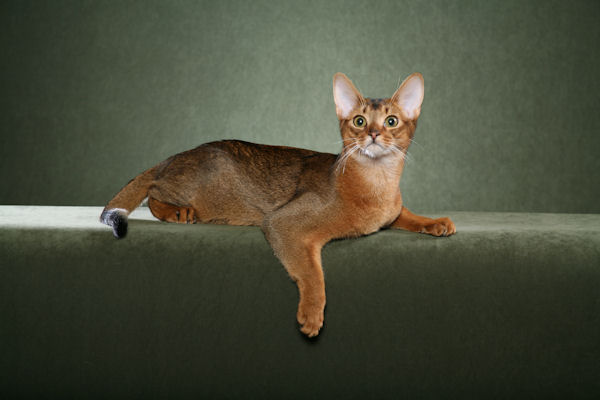

In [4]:
PILImage.create('/home/cgb3/.fastai/data/oxford-iiit-pet/images/Abyssinian_1.jpg')

`-` `Abyssinian_100.jpg`를 보고싶다면?

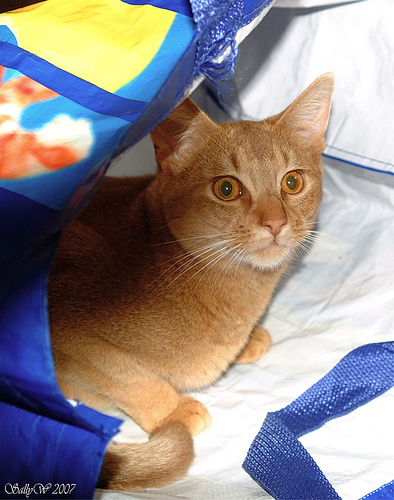

In [5]:
PILImage.create('/home/cgb3/.fastai/data/oxford-iiit-pet/images/Abyssinian_100.jpg')

`-` 그림을 확인 할 수 있는건 좋은데 이렇게 확인하니까 조금 귀찮음..

In [6]:
lst = ['/home/cgb3/.fastai/data/oxford-iiit-pet/images/Abyssinian_1.jpg',
       '/home/cgb3/.fastai/data/oxford-iiit-pet/images/Abyssinian_100.jpg']

In [7]:
lst[0]

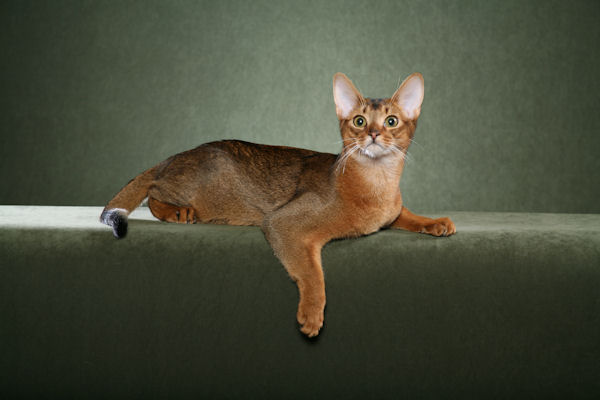

In [8]:
PILImage.create(lst[0])

In [9]:
image_paths = get_image_files('/home/cgb3/.fastai/data/oxford-iiit-pet/images')
image_paths[0]

`-` 그림살펴보기 + 파일명으로 개/고양이 맞춰보기

/home/cgb3/.fastai/data/oxford-iiit-pet/images/boxer_177.jpg

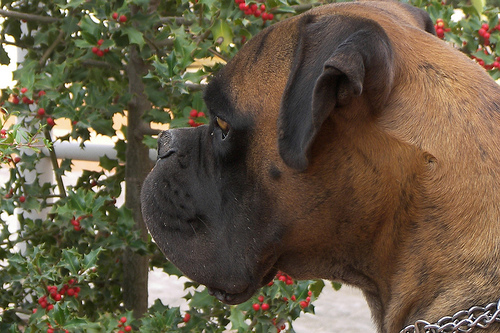

In [10]:
print(image_paths[0])
display(PILImage.create(image_paths[0]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/keeshond_165.jpg

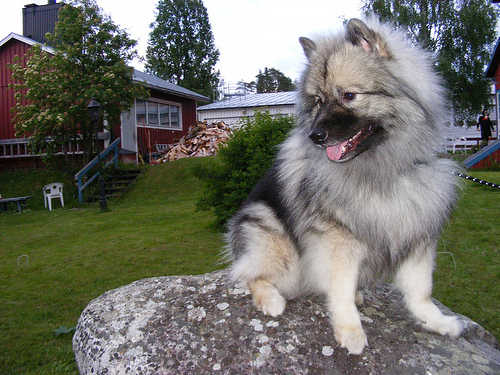

In [11]:
print(image_paths[2])
display(PILImage.create(image_paths[2]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/samoyed_80.jpg

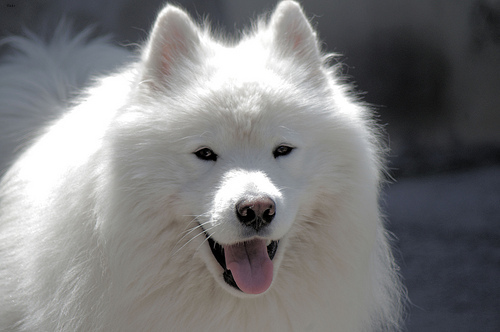

In [12]:
print(image_paths[3])
display(PILImage.create(image_paths[3]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/Siamese_224.jpg

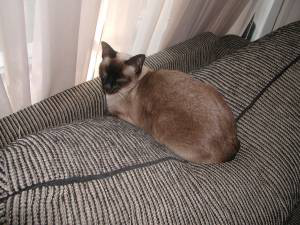

In [13]:
print(image_paths[4])
display(PILImage.create(image_paths[4]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/miniature_pinscher_59.jpg

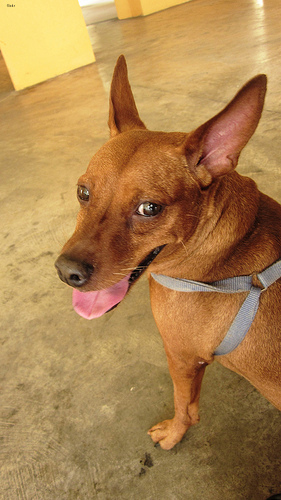

In [14]:
print(image_paths[5])
display(PILImage.create(image_paths[5]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/saint_bernard_159.jpg

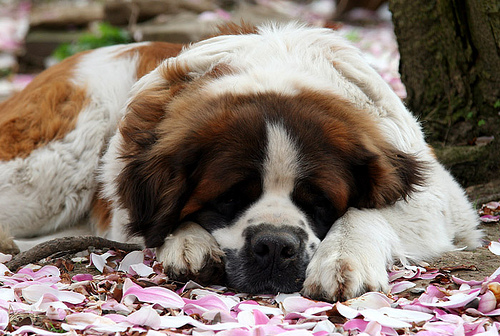

In [15]:
print(image_paths[6])
display(PILImage.create(image_paths[6]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/american_bulldog_143.jpg

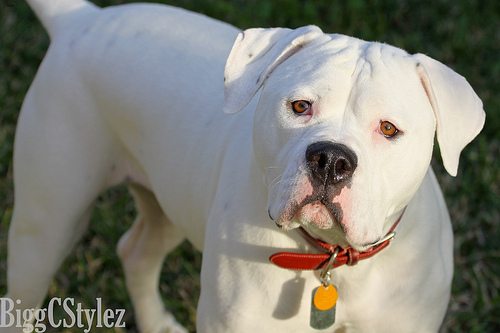

In [16]:
print(image_paths[7])
display(PILImage.create(image_paths[7]))

/home/cgb3/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_142.jpg

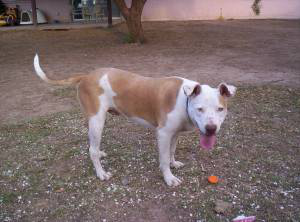

In [17]:
print(image_paths[8])
display(PILImage.create(image_paths[8]))

In [18]:
# 특1: 대문자이면 고양이, 소문자이면 강아지그림이다!! (천재적인 저장방식)
# 특2: 이미지크기가 서로 다르다..

In [19]:
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [20]:
image_paths

In [21]:
dls = ImageDataLoaders.from_name_func(
    path ='/home/cgb3/.fastai/data/oxford-iiit-pet/images',
    fnames = image_paths,
    label_func = label_func,
    item_tfms = Resize(224)
)

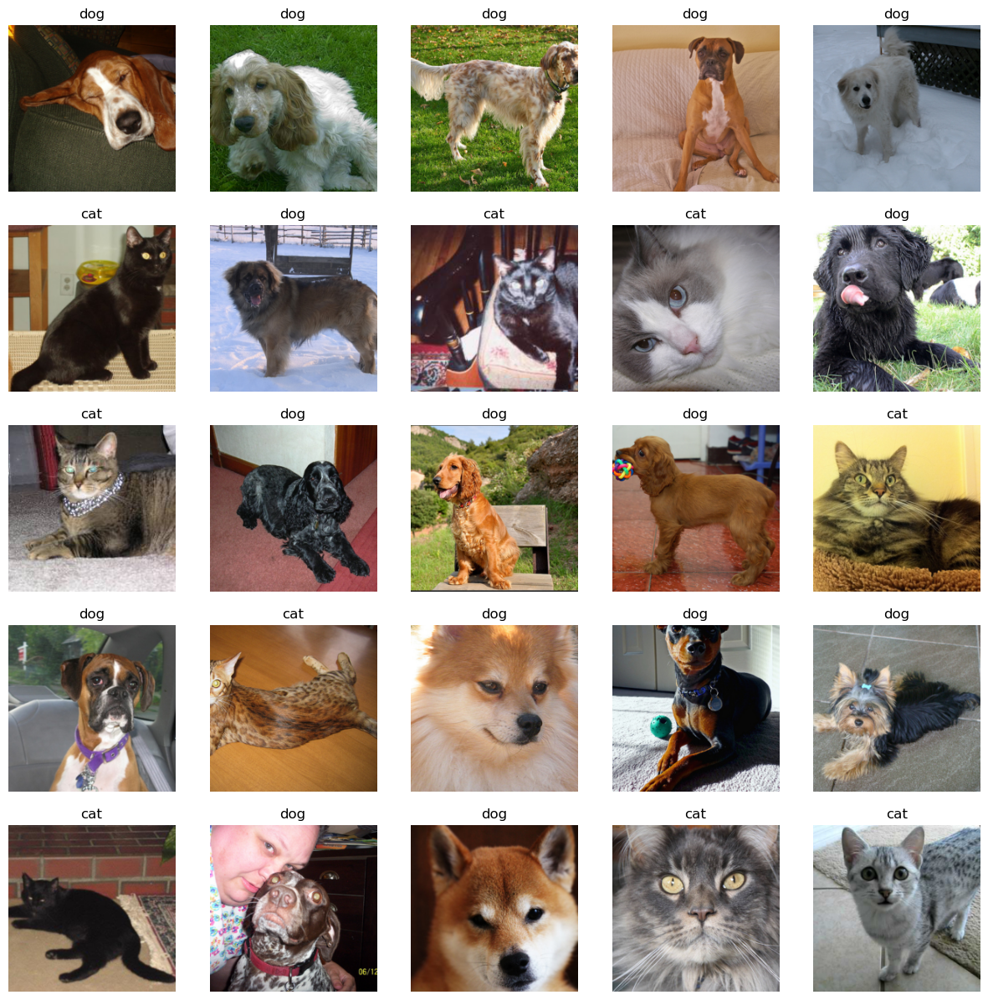

In [22]:
dls.show_batch(max_n=25)

# 4. 학습

In [23]:
lrnr = vision_learner(
    dls = dls,
    arch = resnet34,
    metrics = accuracy
)

In [24]:
lrnr.fine_tune(1) # 학습을 하는 함수

# 5. 기존자료를 잘 맞추는지 확인

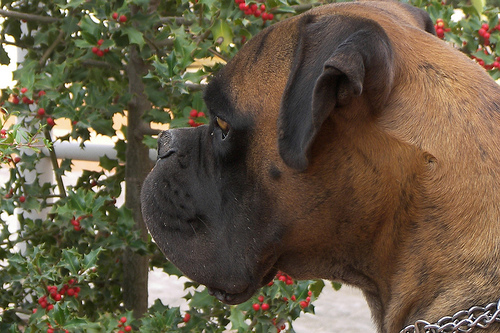

In [25]:
img0 = PILImage.create(image_paths[0]) # 강아지 
img0

In [26]:
lrnr.predict(img0)
#lrnr.predict(PILImage.create(image_paths[0]))
#lrnr.predict(image_paths[0])

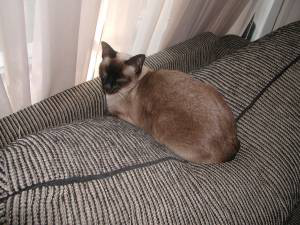

In [27]:
img4 = PILImage.create(image_paths[4])
img4

In [28]:
lrnr.predict(img4)

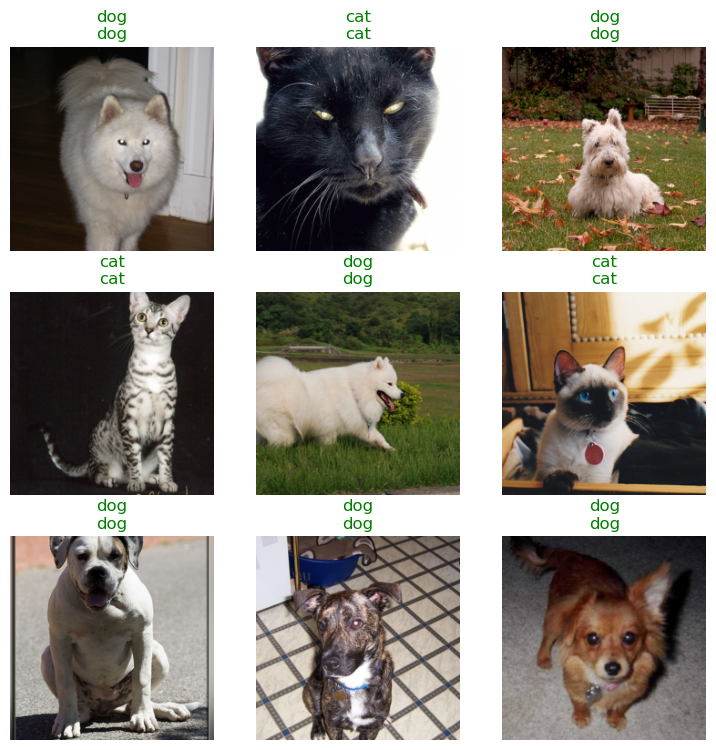

In [29]:
lrnr.show_results()

# 6. 오답분석

In [30]:
inter = Interpretation.from_learner(lrnr) 

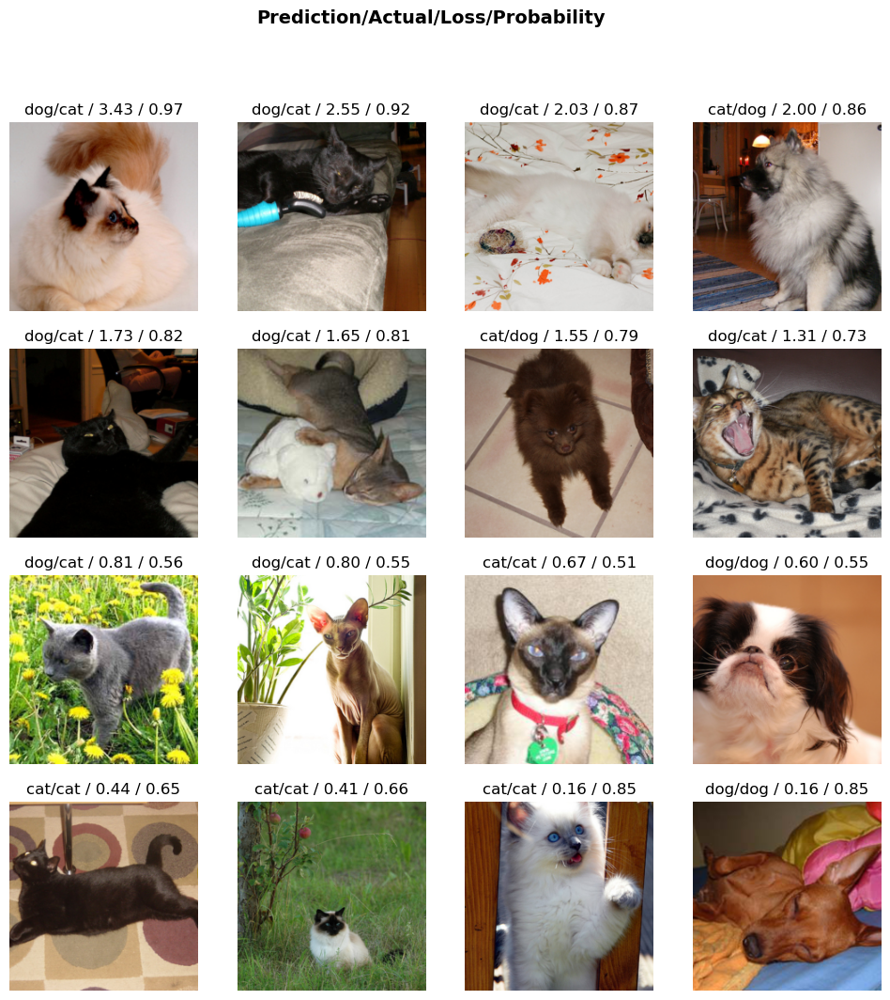

In [31]:
inter.plot_top_losses(16) # 오답을 분석하는 오브젝트는 가장 오류가 높은 이미지를 정렬하여 보여주는 기능이 있음..

# 7. 진짜 잘되는게 맞는건가?

In [32]:
import requests

In [33]:
hani01 = PILImage.create(requests.get('https://github.com/guebin/DL2024/blob/main/posts/01wk-hani01.jpeg?raw=true').content)

In [34]:
lrnr.predict(hani01)

In [35]:
clsfr.predict('/root/.fastai/data/oxford-iiit-pet/images/Egyptian_Mau_34.jpg')

In [ ]:
clsfr.predict(PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Egyptian_Mau_34.jpg'))

In [ ]:
PILImage.create('2022-09-06-cat1.png')

In [ ]:
clsfr.predict(PILImage.create('2022-09-06-cat1.png'))

In [ ]:
PILImage.create('2022-09-06-cat2.jpeg')

In [ ]:
clsfr.predict(PILImage.create('2022-09-06-cat2.jpeg'))

In [ ]:
clsfr.predict(PILImage.create('2022-09-06-hani01.jpeg'))

In [ ]:
clsfr.predict(PILImage.create('2022-09-06-hani02.jpeg'))

In [ ]:
clsfr.predict(PILImage.create('2022-09-06-hani03.jpg'))

# 8. 크롤링

In [36]:
# 크롤링에 필요한 준비작업들
!pip install -U duckduckgo_search
from duckduckgo_search import DDGS

In [37]:
def search_images(keyword, max_images=200):
    with DDGS() as ddgs:
        ddgs_images_gen = ddgs.images(
          keyword,
          max_results=max_images,
        )
        results = [r for r in ddgs_images_gen]
    image_sources = [r['image'] for r in results]
    return image_sources

In [39]:
# 폴더만드는코드 -- 사실 손으로 만들어도 무방함.. 
!mkdir images
!mkdir images/train
!mkdir images/train/iu
!mkdir images/train/hynn

In [40]:
download_images(dest='./images/train/hynn',urls=search_images('HYNN',max_images=200))
download_images(dest='./images/train/iu',urls=search_images('IU',max_images=200)) 

In [41]:
bad_images = verify_images(get_image_files('./images'))
bad_images

In [42]:
bad_images.map(Path.unlink)

# 9. dls $\to$ lrnr -\> fit -\> predict

## A. Step1: DLS(=데이터) 준비

In [43]:
dls = ImageDataLoaders.from_folder(
    path = './images', 
    train='train', 
    valid_pct = 0.2, 
    item_tfms=Resize(224),
) 

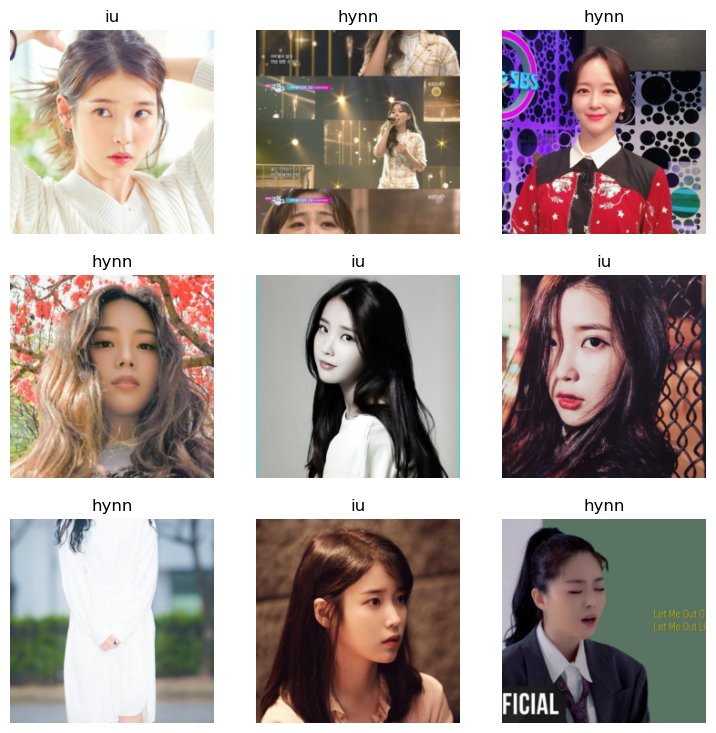

In [44]:
dls.show_batch()

## B. Step2: 러너생성

In [45]:
lrnr = vision_learner(
    dls = dls,
    arch = resnet34, 
    metrics = accuracy
)

## C. Step3: 학습

In [46]:
lrnr.fine_tune(7)

## D. Step4: 예측

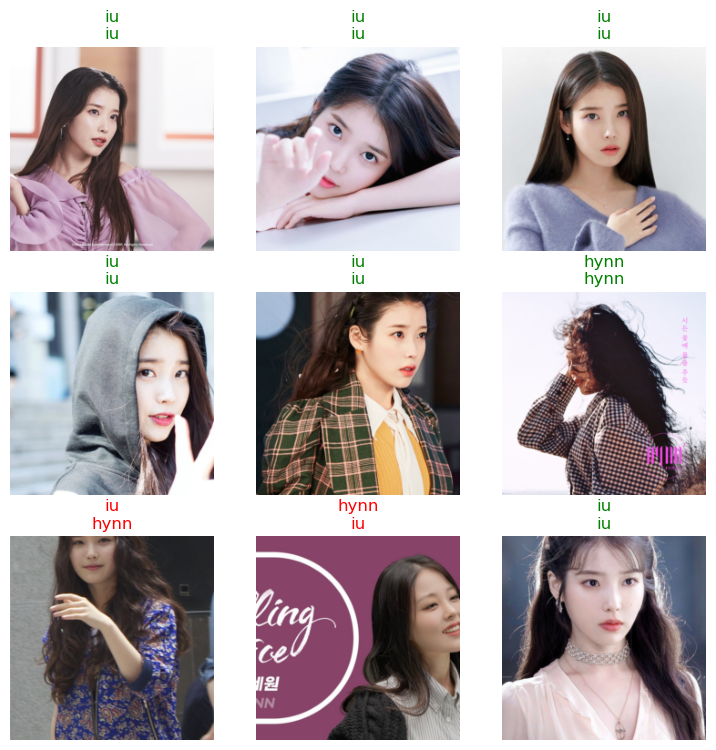

In [49]:
lrnr.show_results()

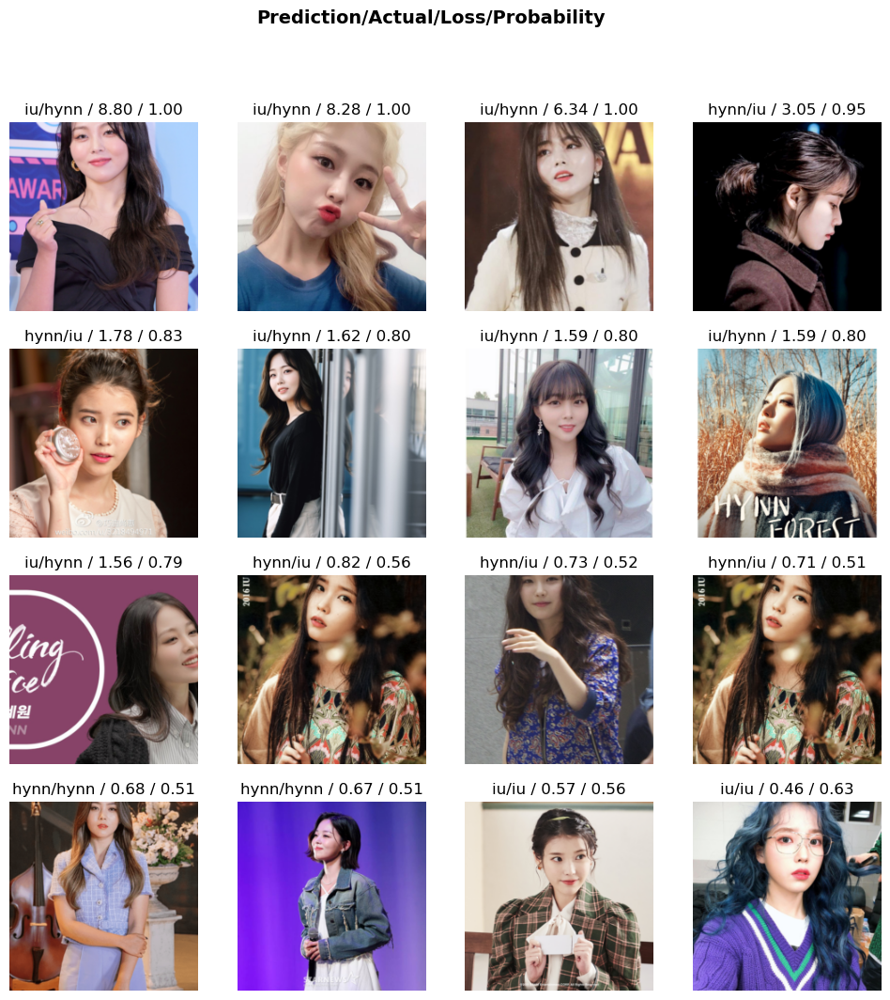

In [50]:
inter = Interpretation.from_learner(lrnr)
inter.plot_top_losses(16)

# 10. 숙제